# Continue here, Analysis!

In [361]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import datetime

In [362]:
# importing dataset
cleaned_data=pd.read_csv('cleaned_data_exported.csv')

In [363]:
#setting rows and columns to display all
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [364]:
# slicing to check my imported dataframe
cleaned_data.head(3)

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.96,2,0.0,41.9136
1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.94,3,0.0,219.5820
2,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.62,2,0.0,6.8714


In [365]:
cleaned_data.tail(3)

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
9991,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,TEC-PH-10003645,Technology,Phones,Aastra 57i VoIP phone,258.576,2,0.2,19.3932
9992,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,OFF-PA-10004041,Office Supplies,Paper,"It's Hot Message Books with Stickers, 2 3/4"" x 5""",29.600,4,0.0,13.3200
9993,CA-2017-119914,2017-05-04,2017-05-09,Second Class,CC-12220,Chris Cortes,Consumer,United States,Westminster,California,92683,West,OFF-AP-10002684,Office Supplies,Appliances,"Acco 7-Outlet Masterpiece Power Center, Wihtou...",243.160,2,0.0,72.9480


In [366]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order ID       9994 non-null   object 
 1   Order Date     9994 non-null   object 
 2   Ship Date      9994 non-null   object 
 3   Ship Mode      9994 non-null   object 
 4   Customer ID    9994 non-null   object 
 5   Customer Name  9994 non-null   object 
 6   Segment        9994 non-null   object 
 7   Country        9994 non-null   object 
 8   City           9994 non-null   object 
 9   State          9994 non-null   object 
 10  Postal Code    9994 non-null   int64  
 11  Region         9994 non-null   object 
 12  Product ID     9994 non-null   object 
 13  Category       9994 non-null   object 
 14  Sub-Category   9994 non-null   object 
 15  Product Name   9994 non-null   object 
 16  Sales          9994 non-null   float64
 17  Quantity       9994 non-null   int64  
 18  Discount

In [367]:
#checking my total rows and columns
cleaned_data.shape

(9994, 20)

In [368]:
# quick statistics
cleaned_data.describe().round(4)

,Postal Code,Sales,Quantity,Discount,Profit
count,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000
mean,55190.3794,229.8580,3.7896,0.1562,28.6569
std,32063.6934,623.2451,2.2251,0.2065,234.2601
min,1040.0000,0.4440,1.0000,0.0000,-6599.9780
25%,23223.0000,17.2800,2.0000,0.0000,1.7288
50%,56430.5000,54.4900,3.0000,0.2000,8.6665
75%,90008.0000,209.9400,5.0000,0.2000,29.3640
max,99301.0000,22638.4800,14.0000,0.8000,8399.9760


# 1. Create a calculated column for Gross_revenue, _ and Net_sales?

In [369]:
# calculating and/or creating gross revenue column
cleaned_data['Gross_Revenue']=(cleaned_data['Sales'])*(cleaned_data['Quantity'])

# calculating and/or creating netrevenue
cleaned_data['Net_Revenue']= cleaned_data['Sales'] * cleaned_data['Quantity'] - cleaned_data['Discount']

#creating and/or calculating netsales column 
cleaned_data['Net_Sales']=(cleaned_data['Sales'] - cleaned_data['Profit']- cleaned_data['Discount'])


In [370]:
# checking my created columns
cleaned_data.head(40)

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Gross_Revenue,Net_Revenue,Net_Sales
0,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136,523.9200,523.9200,220.0464
1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820,2195.8200,2195.8200,512.3580
2,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714,29.2400,29.2400,7.7486
3,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310,4787.8875,4787.4375,1340.1585
4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164,44.7360,44.5360,19.6516
5,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.8600,7,0.00,14.1694,342.0200,342.0200,34.6906
6,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.2800,4,0.00,1.9656,29.1200,29.1200,5.3144
7,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.1520,6,0.20,90.7152,5442.9120,5442.7120,816.2368
8,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by S...,18.5040,3,0.20,5.7825,55.5120,55.3120,12.5215
9,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.9000,5,0.00,34.4700,574.5000,574.5000,80.4300


# 2. What are the top 10 product by sales?

In [378]:
cleaned_data.shape

(9994, 23)

In [379]:
cleaned_data['Product Name'].unique().shape

(1850,)

In [380]:
# we will be using 2 columns that's productname and sales
cleaned_data['Product Name'].unique()

array(['Bush Somerset Collection Bookcase',
       'Hon Deluxe Fabric Upholstered Stacking Chairs, Rounded Back',
       'Self-Adhesive Address Labels for Typewriters by Universal', ...,
       'Eureka Hand Vacuum, Bagless', 'LG G2',
       'Eldon Jumbo ProFile Portable File Boxes Graphite/Black'],
      dtype=object)

In [381]:
# groupby productname and sum sales,then sort by sales descending

group_Product_by_Sales = pd.DataFrame(cleaned_data.groupby('Product Name').sum()['Sales']).sort_values('Sales')
group_Product_by_Sales.tail(10)

,Sales
Product Name,
High Speed Automatic Electric Letter Opener,17030.312
GBC DocuBind P400 Electric Binding System,17965.068
"HP Designjet T520 Inkjet Large Format Printer - 24"" Color",18374.895
Hewlett Packard LaserJet 3310 Copier,18839.686
GBC Ibimaster 500 Manual ProClick Binding System,19024.500
GBC DocuBind TL300 Electric Binding System,19823.479
HON 5400 Series Task Chairs for Big and Tall,21870.576
Cisco TelePresence System EX90 Videoconferencing Unit,22638.480
Fellowes PB500 Electric Punch Plastic Comb Binding Machine with Manual Bind,27453.384


In [382]:
group_Product_by_Sales['Sales'].sum()

2297200.8603

In [383]:
cleaned_data['Sales'].sum()

2297200.8603000003

# 3. Which of our product is selling the most?

In [384]:
# here most selling products has to do with productname and quantity
# groupby productname,sum quanity, convert to dataframe and sort by quantity descending

Most_selling_product = pd.DataFrame(cleaned_data.groupby('Product Name').sum()['Quantity']).sort_values('Quantity')
Most_selling_product.tail(10)

,Quantity
Product Name,
Staple-based wall hangings,62
"Situations Contoured Folding Chairs, 4/Set",64
GBC Premium Transparent Covers with Diagonal Lined Pattern,67
Storex Dura Pro Binders,71
Avery Non-Stick Binders,71
KI Adjustable-Height Table,74
Staples in misc. colors,86
Easy-staple paper,150
Staple envelope,170


In [385]:
#checking 
Most_selling_product['Quantity'].sum()

37873

In [386]:
#checking
cleaned_data['Quantity'].sum()

37873

# 4. List out our most profitable Category & Subcategory?

In [387]:
cleaned_data['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [388]:
cleaned_data['Sub-Category'].unique()

array(['Bookcases', 'Chairs', 'Labels', 'Tables', 'Storage',
       'Furnishings', 'Art', 'Phones', 'Binders', 'Appliances', 'Paper',
       'Accessories', 'Envelopes', 'Fasteners', 'Supplies', 'Machines',
       'Copiers'], dtype=object)

In [389]:
Most_profit_Cat_Subcat = pd.DataFrame(cleaned_data.groupby(['Category','Sub-Category']).sum(['Profit'])).sort_values(['Category','Profit'])
Most_profit_Cat_Subcat

Postal Code        Sales  Quantity  Discount  \
Category        Sub-Category                                                 
Furniture       Tables           18607828  206965.5320      1241     83.35   
                Bookcases        12771539  114879.9963       868     48.14   
                Furnishings      51880430   91705.1640      3563    132.40   
                Chairs           34936229  328449.1030      2356    105.00   
Office Supplies Supplies         10633558   46673.5380       647     14.60   
                Fasteners        12506063    3024.2800       914     17.80   
                Labels           19552985   12486.3120      1400     25.00   
                Art              43329658   27118.7920      3000     59.60   
                Envelopes        13325731   16476.4020       906     20.40   
                Appliances       25250538  107532.1610      1729     77.60   
                Storage          46248720  223843.6080      3158     63.20   
                Binders          83626398  203412.7330      5974    567.00   
                Paper            76299221   78479.2060      5178    102.60   
Technology      Machines          6364668  189238.6310       440     35.20   
                Accessories      44468434  167380.3180      2976     60.80   
                Phones           47897175  330007.0540      3289    137.40   
                Copiers           3873477  149528.0300       234     11.00   

                                  Profit  Gross_Revenue   Net_Revenue  \
Category        Sub-Category                                            
Furniture       Tables       -17725.4811   1.144514e+06  1.144431e+06   
                Bookcases     -3472.5560   5.978261e+05  5.977780e+05   
                Furnishings   13059.1436   4.541168e+05  4.539844e+05   
                Chairs        26590.1663   1.662758e+06  1.662653e+06   
Office Supplies Supplies      -1189.0995   2.012358e+05  2.012212e+05   
                Fasteners       949.5182   1.705779e+04  1.703999e+04   
                Labels         5546.2540   7.063476e+04  7.060976e+04   
                Art            6527.7870   1.360211e+05  1.359615e+05   
                Envelopes      6964.1767   7.417935e+04  7.415895e+04   
                Appliances    18138.0054   5.473685e+05  5.472909e+05   
                Storage       21278.8264   1.099229e+06  1.099166e+06   
                Binders       30221.7633   1.013454e+06  1.012887e+06   
                Paper         34053.5693   3.894044e+05  3.893018e+05   
Technology      Machines       3384.7569   9.147899e+05  9.147547e+05   
                Accessories   41936.6357   8.789225e+05  8.788617e+05   
                Phones        44515.7306   1.628828e+06  1.628691e+06   
                Copiers       55617.8249   6.577212e+05  6.577102e+05   

                                Net_Sales  
Category        Sub-Category               
Furniture       Tables        224607.6631  
                Bookcases     118304.4123  
                Furnishings    78513.6204  
                Chairs        301753.9367  
Office Supplies Supplies       47848.0375  
                Fasteners       2056.9618  
                Labels          6915.0580  
                Art            20531.4050  
                Envelopes       9491.8253  
                Appliances     89316.5556  
                Storage       202501.5816  
                Binders       172623.9697  
                Paper          44323.0367  
Technology      Machines      185818.6741  
                Accessories   125382.8823  
                Phones        285353.9234  
                Copiers        93899.2051

In [390]:
#checking 
cleaned_data['Quantity'].sum()

37873

In [391]:
#checking
Most_profit_Cat_Subcat['Quantity'].sum()

37873

# 5. Which are the most prefered shipmode?

In [395]:
cleaned_data['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

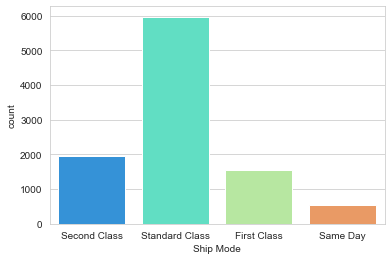

In [396]:
# using seaborn countplot to dislay the shipmode
sns.set_style('whitegrid')
dataviz=sns.countplot( x='Ship Mode', data = cleaned_data, palette= 'rainbow')

# 6. Which are the most prefered shipmode by region?

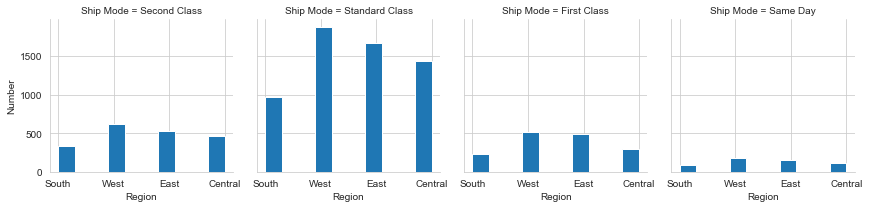

In [397]:
Region_hist=sns.FacetGrid(data=cleaned_data,col='Ship Mode', palette='rainbow')
Region_hist.map(plt.hist,'Region')
Region_hist.set_ylabels('Number')

# 7. what are the monthly and yearly sales trend?

In [398]:
# created a seperate column for month and year
cleaned_data['month']=pd.DatetimeIndex(cleaned_data['Order Date']).month
cleaned_data['year']=pd.DatetimeIndex(cleaned_data['Order Date']).year

In [399]:
cleaned_data

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Gross_Revenue,Net_Revenue,Net_Sales,month,year
0,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136,523.9200,523.9200,220.0464,11,2016
1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820,2195.8200,2195.8200,512.3580,11,2016
2,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714,29.2400,29.2400,7.7486,6,2016
3,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310,4787.8875,4787.4375,1340.1585,10,2015
4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164,44.7360,44.5360,19.6516,10,2015
5,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.8600,7,0.00,14.1694,342.0200,342.0200,34.6906,6,2014
6,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.2800,4,0.00,1.9656,29.1200,29.1200,5.3144,6,2014
7,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.1520,6,0.20,90.7152,5442.9120,5442.7120,816.2368,6,2014
8,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by S...,18.5040,3,0.20,5.7825,55.5120,55.3120,12.5215,6,2014
9,CA-2014-115812,2014-06-09,2014-06-14,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.9000,5,0.00,34.4700,574.5000,574.5000,80.4300,6,2014


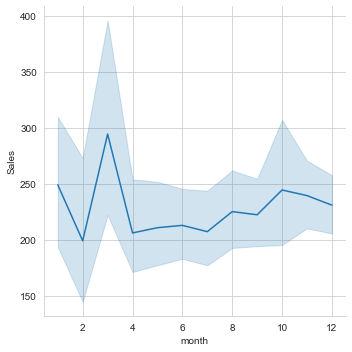

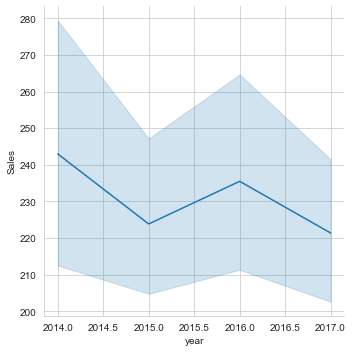

In [400]:
# monthly sales trend
sns.relplot( x='month', y='Sales', data = cleaned_data, kind='line')

# yearly sales trend
sns.relplot(x='year', y='Sales', data = cleaned_data, kind='line')


# 8. "more visualization and storying telling" powerBi and Python, still to come!